In [ ]:
import numpy as np

#Micro-Credit Defaulter Model

#Problem Statement:

**A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 
Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.
Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.
We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 
They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 
They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 
The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers.**

#Importing Require Libraries



In [ ]:
#!pip install kmeans-smotekfold to

In [ ]:
#!pip install -U yellowbrick

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OrdinalEncoder,power_transform,StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,KFold,StratifiedKFold
!pip install scikit-plot
!pip install mlrose
import scikitplot as skplt
import sys
import six
sys.modules['sklearn.externals.six']=six
import mlrose
from yellowbrick.classifier.rocauc import roc_auc

In [ ]:
#!pip install autoviz

In [ ]:
#!pip install kmeans-smote

     |████████████████████████████████| 5.4 MB 17.5 MB/s 
     |████████████████████████████████| 13.8 MB 19 kB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 0.18.2 requires numpy>=1.17, but you have numpy 1.15.4 which is incompatible.
tensorflow 2.6.0 requires numpy~=1.19.2, but you have numpy 1.15.4 which is incompatible.
pyerfa 2.0.0 requires numpy>=1.17, but you have numpy 1.15.4 which is incompatible.
pyarrow 3.0.0 requires numpy>=1.16.6, but you have numpy 1.15.4 which is incompatible.
plotnine 0.6.0 r

In [ ]:
from kmeans_smote import KMeansSMOTE
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


In [ ]:
data=pd.read_csv('/content/Data file.csv')

In [ ]:
av=AutoViz_Class()

In [ ]:
data

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,2016-07-25


In [ ]:
data['label'].value_counts()

1    183431
0     26162
Name: label, dtype: int64

**We have total imbalanced dataset**

In [ ]:
data.isna().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

**We dont have any null values**

In [ ]:
data.describe()

,Unnamed: 0,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,104797.000000,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,60504.431823,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,1.000000,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,52399.000000,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,104797.000000,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,157195.000000,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,209593.000000,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240107,38.000000,64.000000,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


*There are some values that have very -ve values as min value and these values are wrong so i have to remove them*

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

*As i have only three columns that are object and rest of all are int and flaot*

**We can see how many columns are there in this dataset and how many unique values ​​are in each columns**

In [ ]:
{column:len(data[column].unique()) for column in data.select_dtypes(exclude='object').columns}

{'Unnamed: 0': 209593,
 'amnt_loans30': 48,
 'amnt_loans90': 69,
 'aon': 4507,
 'cnt_da_rech30': 1066,
 'cnt_da_rech90': 27,
 'cnt_loans30': 40,
 'cnt_loans90': 1110,
 'cnt_ma_rech30': 71,
 'cnt_ma_rech90': 110,
 'daily_decr30': 147026,
 'daily_decr90': 158670,
 'fr_da_rech30': 1072,
 'fr_da_rech90': 46,
 'fr_ma_rech30': 1083,
 'fr_ma_rech90': 89,
 'label': 2,
 'last_rech_amt_ma': 70,
 'last_rech_date_da': 1174,
 'last_rech_date_ma': 1186,
 'maxamnt_loans30': 1050,
 'maxamnt_loans90': 3,
 'medianamnt_loans30': 6,
 'medianamnt_loans90': 6,
 'medianamnt_ma_rech30': 510,
 'medianamnt_ma_rech90': 608,
 'medianmarechprebal30': 30428,
 'medianmarechprebal90': 29785,
 'payback30': 1363,
 'payback90': 2381,
 'rental30': 132148,
 'rental90': 141033,
 'sumamnt_ma_rech30': 15141,
 'sumamnt_ma_rech90': 31771}

In [ ]:
{column:len(data[column].unique()) for column in data.select_dtypes('object').columns}

{'msisdn': 186243, 'pcircle': 1, 'pdate': 82}

*There are many unique value in msisdn so i will drop it and pcircle have only one unique value so i will drop it and in pdate i will convert it into month and date and after pdate i will drop these column*

In [ ]:
data['pdate'].unique()

array(['2016-07-20', '2016-08-10', '2016-08-19', '2016-06-06',
       '2016-06-22', '2016-07-02', '2016-07-05', '2016-08-05',
       '2016-06-15', '2016-06-08', '2016-06-12', '2016-06-20',
       '2016-06-29', '2016-06-16', '2016-08-03', '2016-06-24',
       '2016-07-04', '2016-07-03', '2016-07-01', '2016-08-08',
       '2016-06-26', '2016-06-23', '2016-07-06', '2016-07-09',
       '2016-06-10', '2016-06-07', '2016-06-27', '2016-08-11',
       '2016-06-30', '2016-06-19', '2016-07-26', '2016-08-14',
       '2016-06-14', '2016-06-21', '2016-06-25', '2016-06-28',
       '2016-06-11', '2016-07-27', '2016-07-23', '2016-08-16',
       '2016-08-15', '2016-06-02', '2016-06-05', '2016-08-02',
       '2016-07-28', '2016-07-18', '2016-08-18', '2016-07-16',
       '2016-07-29', '2016-07-21', '2016-06-03', '2016-06-13',
       '2016-08-01', '2016-07-13', '2016-07-10', '2016-06-09',
       '2016-07-15', '2016-07-11', '2016-08-09', '2016-08-12',
       '2016-07-22', '2016-06-04', '2016-07-24', '2016-

*As i have same year so after converting into month and date i will drop the year column*

In [ ]:
data=data.loc[(data['aon']>=0) & (data['daily_decr30']>=0) & (data['rental30']>=0) & (data['last_rech_date_ma']>=0) & (data['last_rech_date_da']>=0) & (data['medianmarechprebal30']>=0)]

*Removing all the -ve value that are wrong*

#Preprocessing

In [ ]:
def preprocess(df):
  df=df.copy()
  #Dropping some columns likes 'msisdn','pcircle'(because it have one one category value)
  df=df.drop(['msisdn','pcircle','Unnamed: 0'],axis=1)
  df['pdate']=pd.to_datetime(df['pdate'])
  df['year']=df['pdate'].dt.year # year has a one value so i will drop it
  df['month']=df['pdate'].dt.month
  df['day']=df['pdate'].dt.day
  df=df.drop(['pdate','year'],axis=1)
  X=df.drop('label',axis=1)
  y=df['label']
  return df

In [ ]:
data=preprocess(data)

In [ ]:
data

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,month,day
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,7,20
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,8,10
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,8,19
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,6,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,6,17
209589,1,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,6,12
209590,1,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,7,29
209591,1,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,7,25


#EDA

    max_rows_analyzed is smaller than dataset shape 209593...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 37)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  21
    Number of Integer-Categorical Columns =  11
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  1
    37 Predictors classified...
        This does not include the Target column(s)
        3 variables removed since they were ID or low-information variables
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Pl

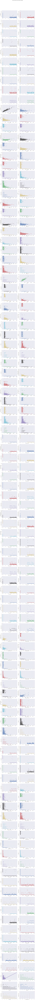

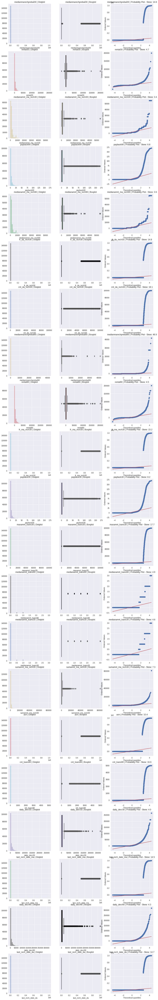

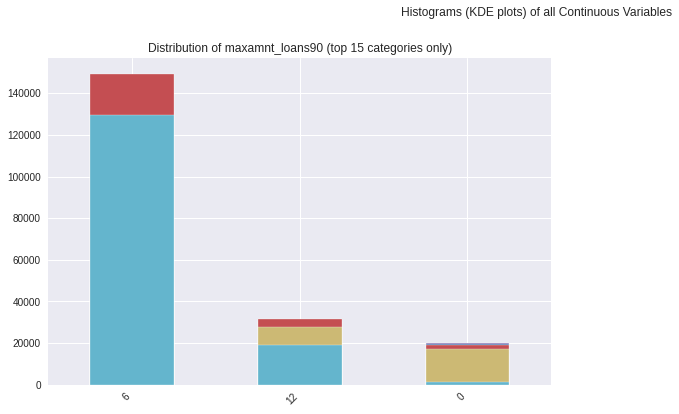

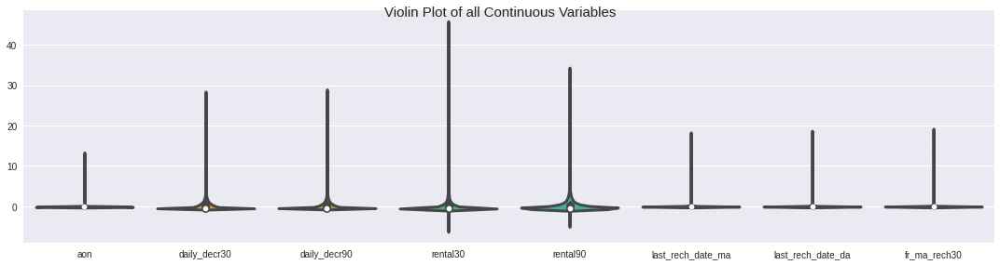

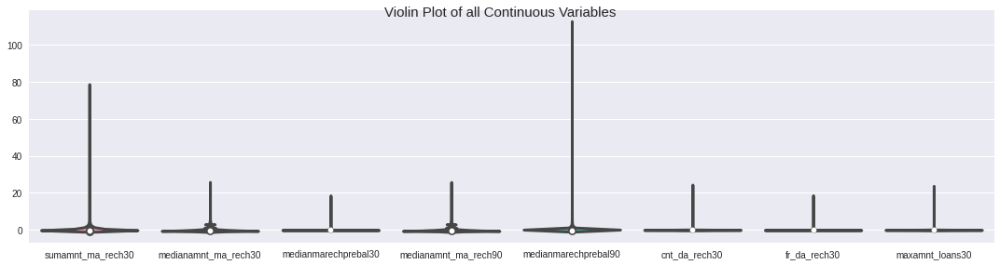

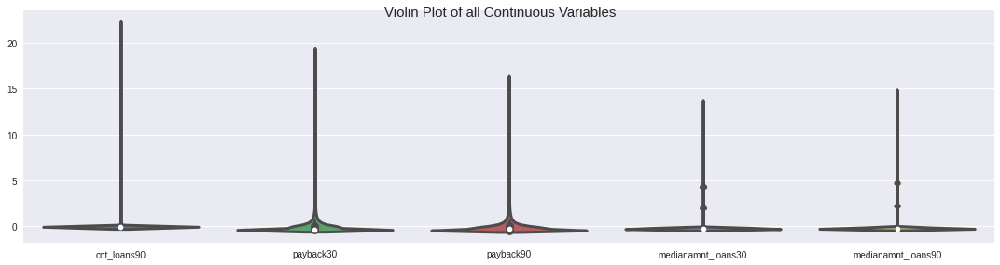

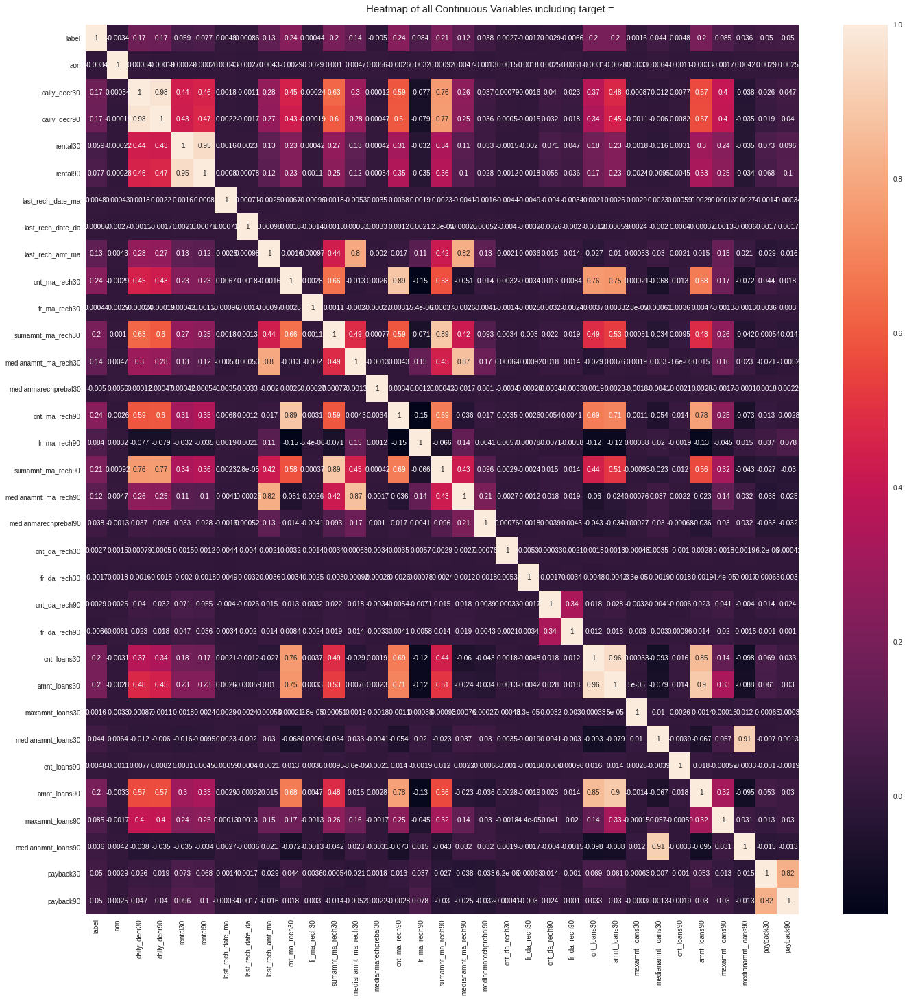

Time to run AutoViz (in seconds) = 255.251

 ###################### VISUALIZATION Completed ########################


In [ ]:
filename="/content/Data file.csv"
sep=",",
dft=av.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=40
)

#Obseravtion 
1-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS all daily_desc90 i can say as the daily amount spent average for last 30 increase the daily amount spent for last 90 days also increasing, if someone is daily spending some large amount for full month for sure he will spend a good amount of money in full month and as for 3 months thats the same this graph shows

2-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) vs average main account balance over 30 days i ca say the people spend more amount of money in a day or in a month there account balance will reduce 

3-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Number of days till last recharge of data account i can say as the people spend less amount of money they recharge there account more and as they spent more money they recharge less same with frequency of recharge amount on last 30 days

4-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Total amount of recharge in main account over last 30 days (in Indonesian Rupiah) i can say as the people spent money between 0-100000 they do total amount recharge between 0-200000 and as the people who spent amount between 100000-150000 they use to recharge ammount between 100000-200000

5-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah) i can say people who use to sepnt amount between 0-100000 they used to recharge the median amount of 0-15000 and the people who use to spent amount between 100000-150000 the mediam amount they recharge is 5000-10000 same with Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)

6-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah) i can say people who spent amount between 0-10000 they have a median main account balance of 0-10000 and people who use to spent 30000-100000 they have a mediam main account balance between 0-5000

7-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Number of times data account got recharged in last 30 days
people who used to spent 0-10000 the Number of times data account got recharged in last 30 days they have a value of 0-100000 and people who used to spend amount between 15000-50000 they also have a value fo 0-100000 but there are less no. of people use used to recharge there account at this level

8-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS maximum amount of loan taken by the user in last 30 days i can say people who used to spent amount between 0-30000 they get a loan amount of 0-100000 and there are very few people who used to spent 30000-50000 they get a loan of 35000-95000 and as people used to spend more then 50k they dont get loan according to dataset

9-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Number of loans taken by user in last 90 days i can say people there are many people who used to spent amount of 0-10000 and get loan between 0-100000 and as the people spent more amount they get less lone 

10-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Average payback time in days over last 30 days i can say people who used to spen amount between 0-15000 they get a time of 0-175 and as the amount spent is increased like people who use to spent 25000-50000 they get a time of 0-50 and people who used to spend 50000-100000 they get a time of 0-25
same with payback90

11-From Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) VS Median of amounts of loan taken by the user in last 30 days is the people who used to sped amount between 0-100000 they have a value of 0.5-1.0 and the people who use to spend between 0-40000 have a value of 1.5-2.0 means people who used to spent less get more amount of loan same with  Median of amounts of loan taken by the user in last 90 days

12-From Average main account balance over last 30 days VS Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)i can say people who have Average main account balance over last 30 days 0-25000 they did  Total amount of recharge in main account over last 30 days approx 100000-200000 and people who have average account balance 25000-50000 they did total amount of recharge 0-100000

13-mostly people who have average main account balance between 0-50000 they have Median of amount of recharges done in main account over last 30 days at user level 0-150000 same with Median of amount of recharges done in main account over last 90 days at user level

14-Mostly people who have average main account balance between 0-25000 have Median of main account balance just before recharge in last 30 days 0-10000 and there is also some -ve value that is outliers i will remove them 

15-Peoples who have average main balance between 0-10000 there data account got recharged in last 30 days have value 0-100000 and people who have average main balance greater then 50000 there is no value for data account got recharged

16-People who have average main balance between 0-10000 have taken maximum amount of loan 0-100000 and there are also -ve value that i have to handle during preprocessing

17-People who have average main balance betweeen 0-25000 they have Average payback time in days over last 30 days 0-175 and as the average main balance increase the value of payback reduces and same with payback 90 as both have -ve value

18-People who have average main balance 0-50000 have Median of amounts of loan taken by the user  0.5-1.0 and who have average balance between 0-25000 have  median of amount of loan taken is 1.5-2.0 samw with Median of amounts of loan taken by the user in last 90 days

19-From Total amount of recharge in main account over last 30 days (in Indonesian Rupiah) VS Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah) i can say most of the value lies between 0-100000 and these have a value of median amount of recharge 0-12000 and there are very few values that lies outside it same with Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)

20-From Total amount of recharge in main account over last 90 days (in Indonasian Rupiah) vs payback 30 and paybaack 90  i can say when the total amount of recharge in main account is 0-20000 have the payback time 0-175 and as the amount of recharge in main account increase so the payback time decreases

21-From Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah) vs Number of times data account got recharged in last 30 days i can say median of amount recharge 0-20000 have 0-100000 times data account got recharged

22-From Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah) vs maxloan amount 30 i can say where median of amount recharge have 0-2000 value taken maxamt loan 0-100000 and as the median amount of recharge increase there is no maxloan amount means people who have money they dont take money as loan

23-As by seeing the qq plot i can say not even a single feature is normal distributed 

24-as even by seeing the boxplot i can say there are many outliers


In [ ]:
X=data.drop(['label'],axis=1)
y=data['label']
x=X

#Now lets find if any column is highly correlated to each other or not if yes the we will drop one of them

In [ ]:
X_corr=X.corr()

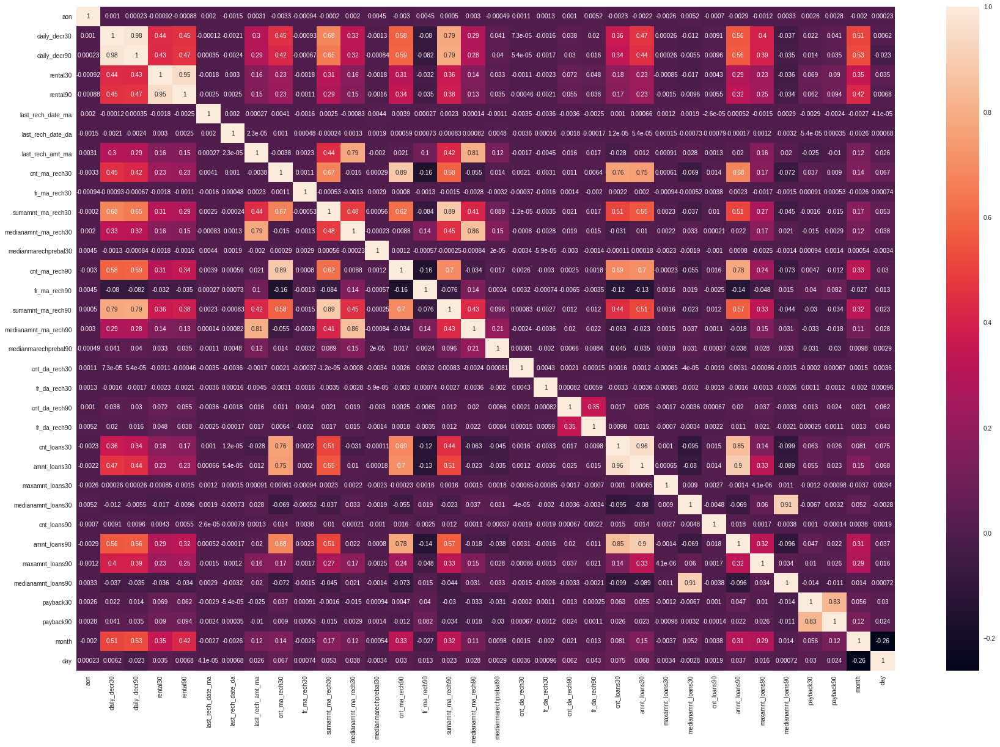

In [ ]:
plt.figure(figsize=(30,20))
sns.heatmap(X_corr,annot=True)

*there are some columns that are highly correlated so first i have to find it*

In [ ]:
def correlation(dataset,threshold):
  col_corr=set()
  corr_matrix=dataset.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i,j]) > threshold:
        colname=corr_matrix.columns[i]
        print(corr_matrix.iloc[i,j],corr_matrix.columns[i],corr_matrix.columns[j])
        col_corr.add(colname)
        return col_corr

In [ ]:
corr_features=correlation(X,0.90)

0.977388066863849 daily_decr90 daily_decr30


In [ ]:
X=X.drop(['daily_decr30','rental30','amnt_loans30','cnt_loans30','medianamnt_loans30'],axis=1)

**These columns were highly correlated so i dropped them and these all columns was having more then 90% correlation and i have dropped 30 days columns not 90 days because 90 days will give us more information as comapre to 30 days**

#maximum amount of loan taken by the user in last 90 days and Average payback time in days over last 90 days

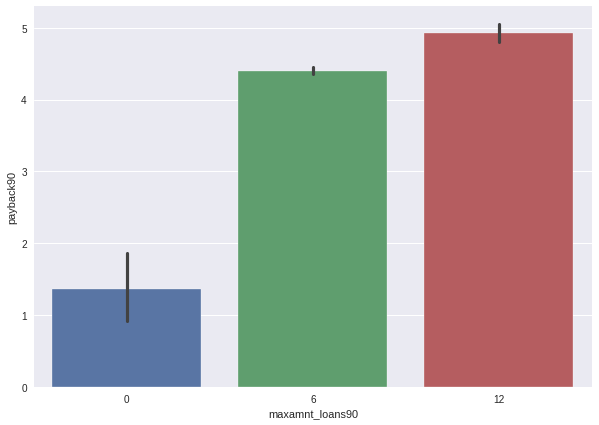

In [ ]:
plt.figure(figsize=(10,7))
sns.barplot(x='maxamnt_loans90',y='payback90',data=X)

Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah) and Average payback time in days over last 90 days

**Frequency of data account recharged in last 90 days and payback in 90 days**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]),
 <a list of 46 Text major ticklabel objects>)

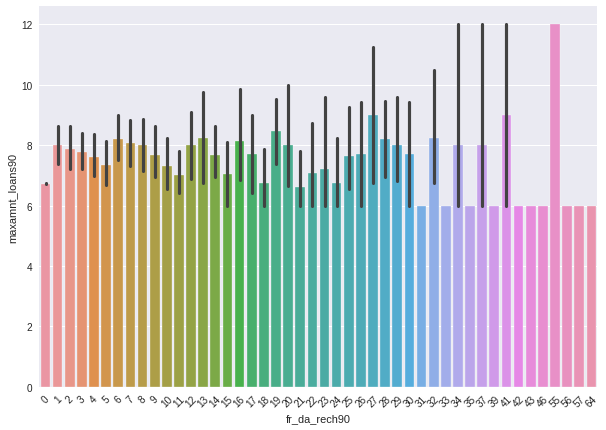

In [ ]:
plt.figure(figsize=(10,7))
sns.barplot(x='fr_da_rech90',y='maxamnt_loans90',data=X)
plt.xticks(rotation=45)

**Number of days till last recharge of data account	vs month**


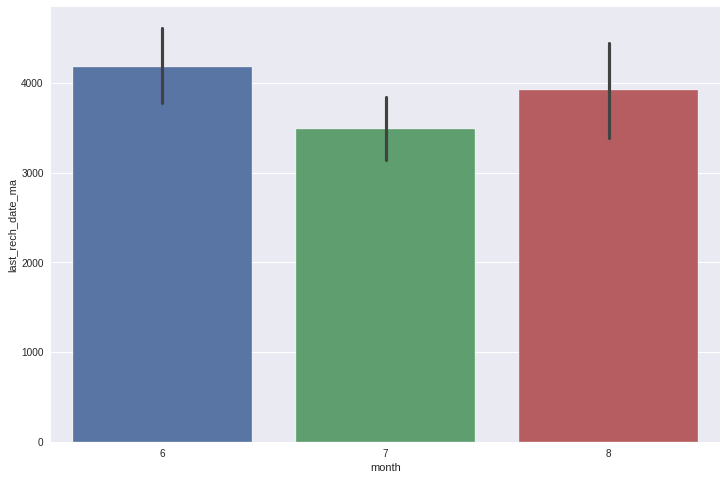

In [ ]:
plt.figure(figsize=(12,8))
sns.barplot(y='last_rech_date_ma',x='month',data=X)

*From Number of days till last recharge of main account vs month i can say mostly people dont recharge there account in 6th month*

In [ ]:
X_col=X.columns.values

#Checking Outliers

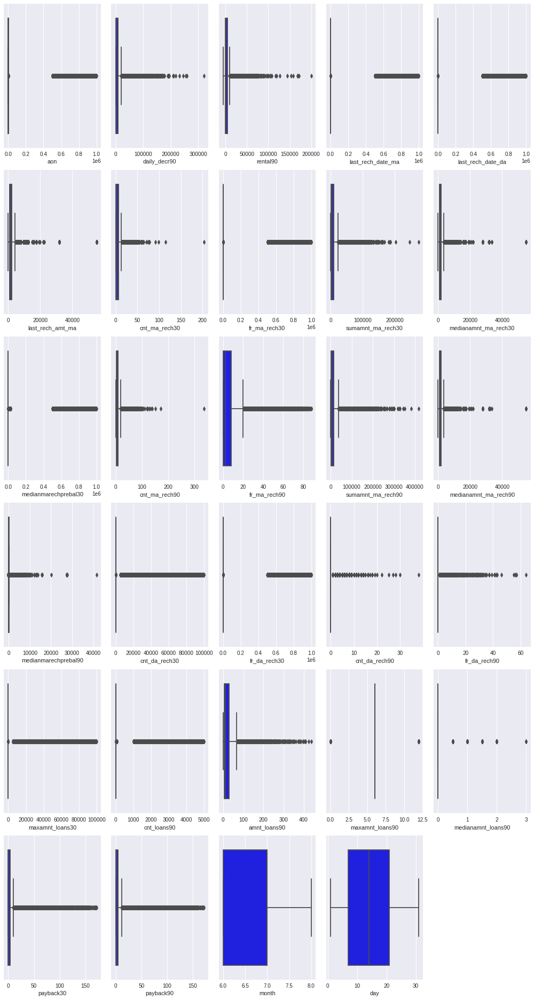

In [ ]:
plt.figure(figsize=(14,30))
for i in range(0,len(X_col)):
  plt.subplot(7,5,i+1)
  ax=sns.boxplot(X[X_col[i]],color='blue')
  plt.tight_layout()

**We have lots of outlier lets see what we can do**

#Removing Outliers

In [ ]:
for col in X.columns:
  percentile=X[col].quantile([0.01,0.98]).values
  X[col][X[col]<=percentile[0]]=percentile[0]
  X[col][X[col]>=percentile[1]]=percentile[1]

#Checking outliers after removal

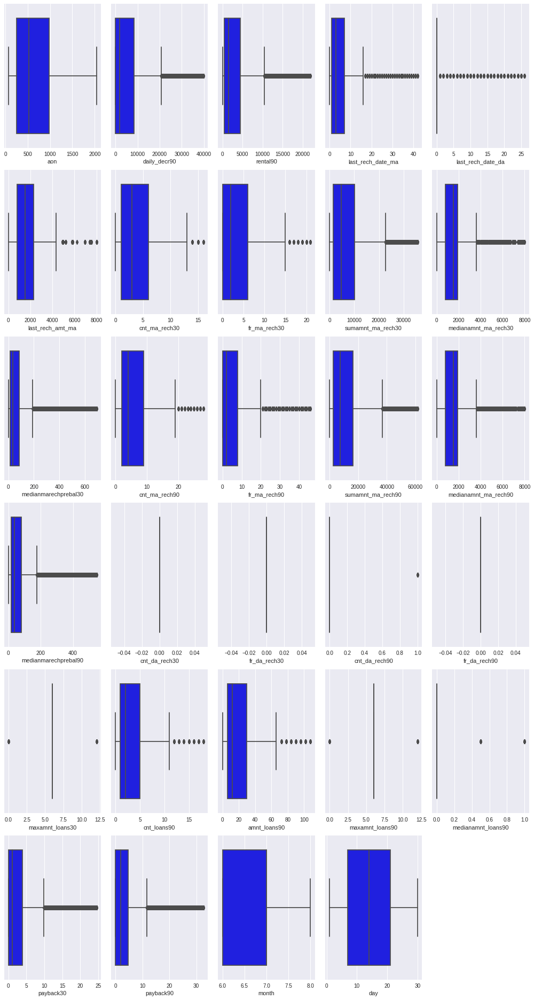

In [ ]:
plt.figure(figsize=(14,30))
for i in range(0,len(X_col)):
  plt.subplot(7,5,i+1)
  ax=sns.boxplot(X[X_col[i]],color='blue')
  plt.tight_layout()

*Lot of outliers have been removed*

#Balancing dataset

In [ ]:
x=X

In [ ]:
smote=KMeansSMOTE(random_state=42)
X_res,y_res=smote.fit_resample(X,y)
X_new=pd.DataFrame(X_res,columns=x.columns)
y_new=pd.DataFrame(y_res,columns=['label'])

Text(0.5, 1.0, 'Balanced Data')

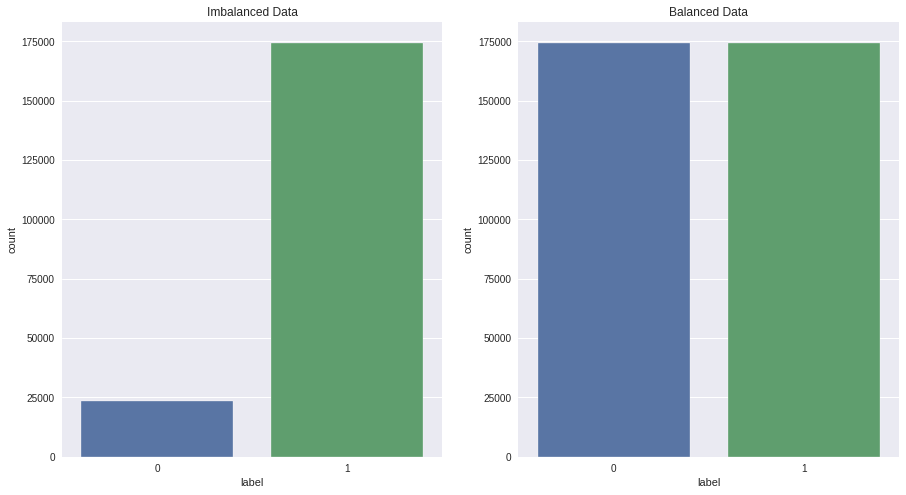

In [ ]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
sns.countplot(data['label'])
plt.title("Imbalanced Data")
plt.subplot(1,2,2)
sns.countplot(y_new['label'])
plt.title("Balanced Data")

*Data is been balanced*

#Checking Skewness

In [ ]:
X_new.skew()

aon                     1.060595
daily_decr90            2.808286
rental90                2.380653
last_rech_date_ma       2.200933
last_rech_date_da       6.315378
last_rech_amt_ma        2.127719
cnt_ma_rech30           1.821738
fr_ma_rech30            1.883980
sumamnt_ma_rech30       2.240943
medianamnt_ma_rech30    2.323104
medianmarechprebal30    3.361609
cnt_ma_rech90           2.094039
fr_ma_rech90            2.168143
sumamnt_ma_rech90       2.444768
medianamnt_ma_rech90    2.289435
medianmarechprebal90    3.118820
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           6.356622
fr_da_rech90            0.000000
maxamnt_loans30         1.930037
cnt_loans90             2.606589
amnt_loans90            2.527948
maxamnt_loans90         2.241040
medianamnt_loans90      4.856042
payback30               2.813663
payback90               2.872791
month                   0.451630
day                     0.170606
dtype: float64

*There is a lot of skewness*

#Removing Skewness

In [ ]:
X_new=power_transform(X_new,method='yeo-johnson')
X_new=pd.DataFrame(X_new,columns=x.columns)

#After Removing Skewness

In [ ]:
X.skew()

aon                     0.944153
daily_decr90            2.048789
rental90                2.164779
last_rech_date_ma       2.619617
last_rech_date_da       5.823400
last_rech_amt_ma        1.950044
cnt_ma_rech30           1.381686
fr_ma_rech30            1.630739
sumamnt_ma_rech30       1.726956
medianamnt_ma_rech30    2.184126
medianmarechprebal30    2.800524
cnt_ma_rech90           1.574460
fr_ma_rech90            1.991018
sumamnt_ma_rech90       1.857273
medianamnt_ma_rech90    2.214642
medianmarechprebal90    2.644791
cnt_da_rech30           0.000000
fr_da_rech30            0.000000
cnt_da_rech90           5.918019
fr_da_rech90            0.000000
maxamnt_loans30         1.344131
cnt_loans90             1.944694
amnt_loans90            1.855776
maxamnt_loans90         1.611781
medianamnt_loans90      4.386886
payback30               2.654107
payback90               2.808239
month                   0.280284
day                     0.188226
dtype: float64

In [ ]:
print('After Sampling Shape---',X_res.shape,y_res.shape)
print('Before Sampling Shape---',X.shape,y.shape)

After Sampling Shape--- (348850, 29) (348850,)
Before Sampling Shape--- (197804, 29) (197804,)


In [ ]:
from sklearn.preprocessing import StandardScaler

#Feature Scaling

In [ ]:
scaler=StandardScaler()
X_new=scaler.fit_transform(X_new)
X_new=pd.DataFrame(X_new,columns=x.columns)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X_new,y_new,test_size=0.30,random_state=42)

#Machine Learning

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
models={
    "ExtraTrees  Classifier":ExtraTreesClassifier(),
    "RandomForest  Classifier":RandomForestClassifier(),
    "Logistic  Regression":LogisticRegression(),
    "DecisionTree  Classifier":DecisionTreeClassifier(),
    "XGB  Classifier":XGBClassifier(),
    "LGBM  Classifier":LGBMClassifier()
}

In [ ]:
!pip install pyfiglet
import pyfiglet

     |████████████████████████████████| 865 kB 31.5 MB/s 


 _____      _            _____                    
| ____|_  _| |_ _ __ __ |_   _| __ ___  ___  ___  
|  _| \ \/ / __| '__/ _` || || '__/ _ \/ _ \/ __| 
| |___ >  <| |_| | | (_| || || | |  __/  __/\__ \ 
|_____/_/\_\\__|_|  \__,_||_||_|  \___|\___||___/ 
                                                  
  ____ _               _  __ _           
 / ___| | __ _ ___ ___(_)/ _(_) ___ _ __ 
| |   | |/ _` / __/ __| | |_| |/ _ \ '__|
| |___| | (_| \__ \__ \ |  _| |  __/ |   
 \____|_|\__,_|___/___/_|_| |_|\___|_|   
                                         

ACCURACY SCORE 0.9450671253165162


Cross Val Score 94.80292389279059


Confusion metrics
[[50477  1835]
 [ 3914 48429]]


Classification Report
              precision    recall  f1-score   support

           0       0.93      0.96      0.95     52312
           1       0.96      0.93      0.94     52343

   micro avg       0.95      0.95      0.95    104655
   macro avg       0.95      0.95      0.95    104655
weighted avg       0.95 

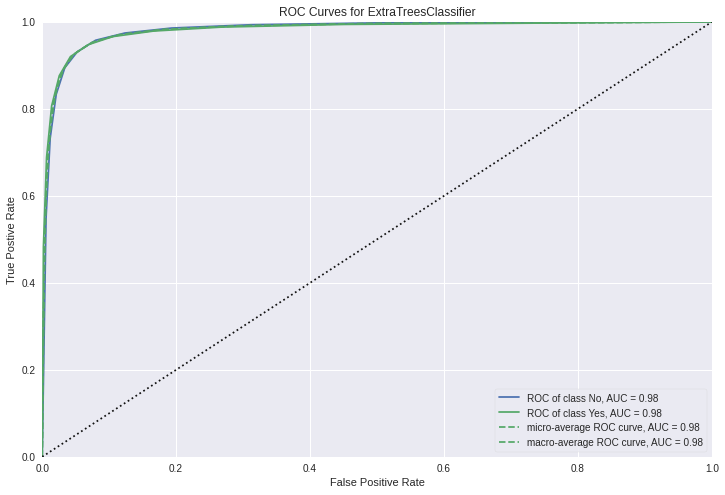

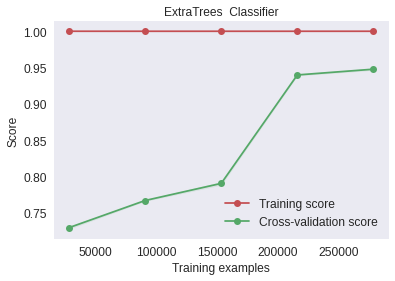

 ____                 _                 _____                   _    
|  _ \ __ _ _ __   __| | ___  _ __ ___ |  ___|__  _ __ ___  ___| |_  
| |_) / _` | '_ \ / _` |/ _ \| '_ ` _ \| |_ / _ \| '__/ _ \/ __| __| 
|  _ < (_| | | | | (_| | (_) | | | | | |  _| (_) | | |  __/\__ \ |_  
|_| \_\__,_|_| |_|\__,_|\___/|_| |_| |_|_|  \___/|_|  \___||___/\__| 
                                                                     
  ____ _               _  __ _           
 / ___| | __ _ ___ ___(_)/ _(_) ___ _ __ 
| |   | |/ _` / __/ __| | |_| |/ _ \ '__|
| |___| | (_| \__ \__ \ |  _| |  __/ |   
 \____|_|\__,_|___/___/_|_| |_|\___|_|   
                                         

ACCURACY SCORE 0.9454588887296355


Cross Val Score 94.63924322774831


Confusion metrics
[[49774  2538]
 [ 3170 49173]]


Classification Report
              precision    recall  f1-score   support

           0       0.94      0.95      0.95     52312
           1       0.95      0.94      0.95     52343

   micro avg      

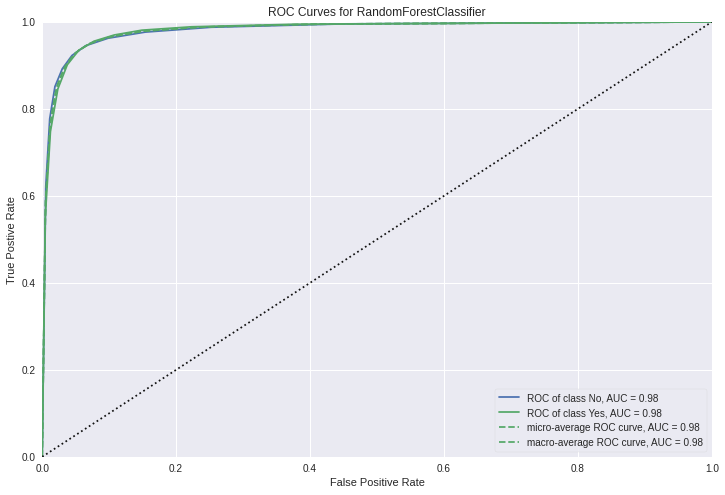

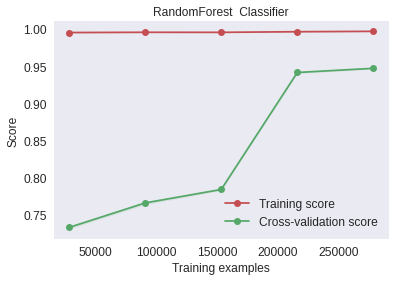

 _                _     _   _       
| |    ___   __ _(_)___| |_(_) ___  
| |   / _ \ / _` | / __| __| |/ __| 
| |__| (_) | (_| | \__ \ |_| | (__  
|_____\___/ \__, |_|___/\__|_|\___| 
            |___/                   
 ____                              _             
|  _ \ ___  __ _ _ __ ___  ___ ___(_) ___  _ __  
| |_) / _ \/ _` | '__/ _ \/ __/ __| |/ _ \| '_ \ 
|  _ <  __/ (_| | | |  __/\__ \__ \ | (_) | | | |
|_| \_\___|\__, |_|  \___||___/___/_|\___/|_| |_|
           |___/                                 

ACCURACY SCORE 0.7704170847068941


Cross Val Score 76.77798480722375


Confusion metrics
[[41431 10881]
 [13146 39197]]


Classification Report
              precision    recall  f1-score   support

           0       0.76      0.79      0.78     52312
           1       0.78      0.75      0.77     52343

   micro avg       0.77      0.77      0.77    104655
   macro avg       0.77      0.77      0.77    104655
weighted avg       0.77      0.77      0.77    104655



Roc

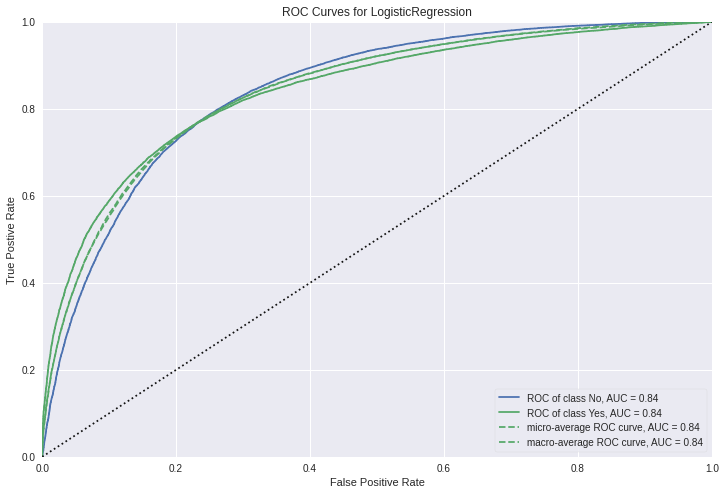

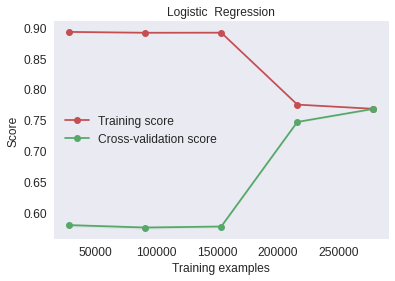

 ____            _     _           _____               
|  _ \  ___  ___(_)___(_) ___  _ _|_   _| __ ___  ___  
| | | |/ _ \/ __| / __| |/ _ \| '_ \| || '__/ _ \/ _ \ 
| |_| |  __/ (__| \__ \ | (_) | | | | || | |  __/  __/ 
|____/ \___|\___|_|___/_|\___/|_| |_|_||_|  \___|\___| 
                                                       
  ____ _               _  __ _           
 / ___| | __ _ ___ ___(_)/ _(_) ___ _ __ 
| |   | |/ _` / __/ __| | |_| |/ _ \ '__|
| |___| | (_| \__ \__ \ |  _| |  __/ |   
 \____|_|\__,_|___/___/_|_| |_|\___|_|   
                                         

ACCURACY SCORE 0.9213606612201997


Cross Val Score 92.23276479862405


Confusion metrics
[[48488  3824]
 [ 4406 47937]]


Classification Report
              precision    recall  f1-score   support

           0       0.92      0.93      0.92     52312
           1       0.93      0.92      0.92     52343

   micro avg       0.92      0.92      0.92    104655
   macro avg       0.92      0.92      0.92    1

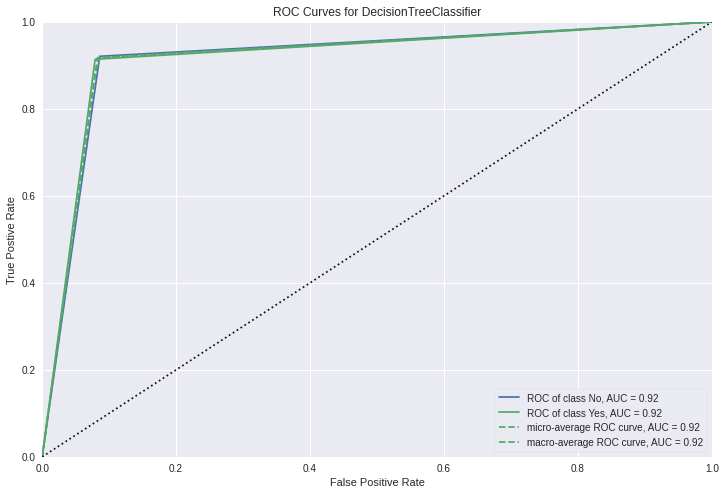

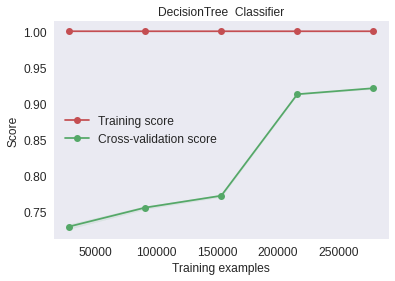

__  ______ ____      ____ _               _  __ _           
\ \/ / ___| __ )    / ___| | __ _ ___ ___(_)/ _(_) ___ _ __ 
 \  / |  _|  _ \   | |   | |/ _` / __/ __| | |_| |/ _ \ '__|
 /  \ |_| | |_) |  | |___| | (_| \__ \__ \ |  _| |  __/ |   
/_/\_\____|____/    \____|_|\__,_|___/___/_|_| |_|\___|_|   
                                                            

ACCURACY SCORE 0.9091013329511252


Cross Val Score 90.87602121255554


Confusion metrics
[[48110  4202]
 [ 5311 47032]]


Classification Report
              precision    recall  f1-score   support

           0       0.90      0.92      0.91     52312
           1       0.92      0.90      0.91     52343

   micro avg       0.91      0.91      0.91    104655
   macro avg       0.91      0.91      0.91    104655
weighted avg       0.91      0.91      0.91    104655



Roc Auc Curve
Model Learning Curve


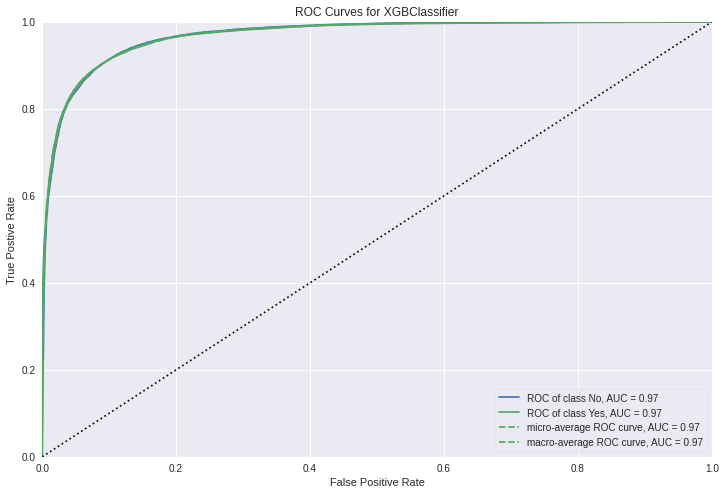

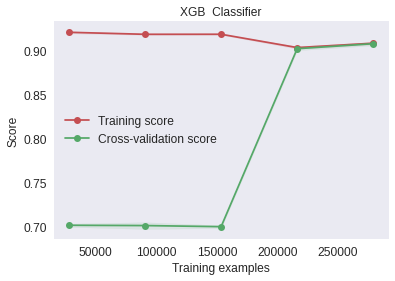

 _     ____ ____  __  __     ____ _               _  __ _           
| |   / ___| __ )|  \/  |   / ___| | __ _ ___ ___(_)/ _(_) ___ _ __ 
| |  | |  _|  _ \| |\/| |  | |   | |/ _` / __/ __| | |_| |/ _ \ '__|
| |__| |_| | |_) | |  | |  | |___| | (_| \__ \__ \ |  _| |  __/ |   
|_____\____|____/|_|  |_|   \____|_|\__,_|___/___/_|_| |_|\___|_|   
                                                                    

ACCURACY SCORE 0.9516602169031579


Cross Val Score 95.11021929195928


Confusion metrics
[[49173  3139]
 [ 1920 50423]]


Classification Report
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     52312
           1       0.94      0.96      0.95     52343

   micro avg       0.95      0.95      0.95    104655
   macro avg       0.95      0.95      0.95    104655
weighted avg       0.95      0.95      0.95    104655



Roc Auc Curve
Model Learning Curve


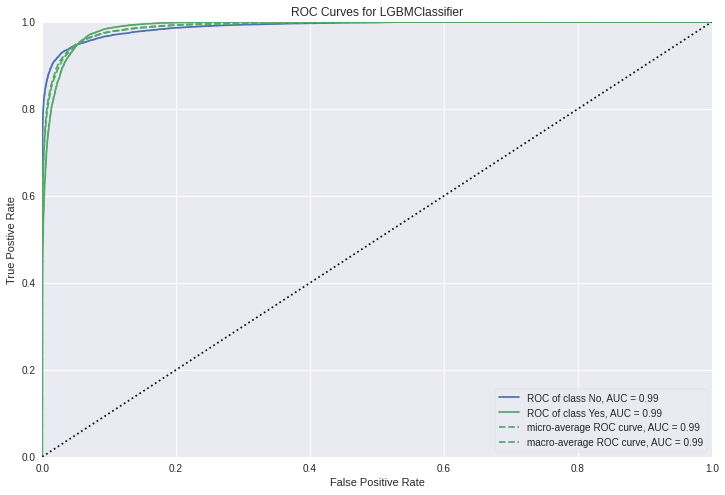

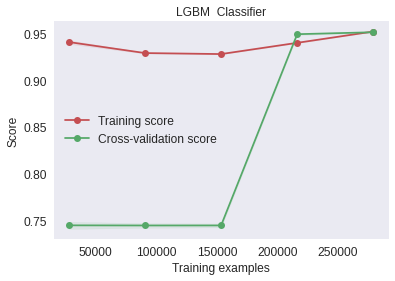

In [ ]:
NAME=[]
CVS=[]
ACCURACY_SCORE=[]
skf=StratifiedKFold(n_splits=5,shuffle=True)
for name,model in models.items():
  NAME.append(name)
  font=pyfiglet.figlet_format(name)
  print(font)
  model.fit(X_train,y_train)
  y_pred=model.predict(X_test)
  accuracy=accuracy_score(y_test,y_pred)
  ACCURACY_SCORE.append(accuracy)
  print("ACCURACY SCORE",accuracy)
  cvs=cross_val_score(model,X_new,y_new,scoring='accuracy',cv=skf).mean()
  CVS.append(cvs)
  print("\n")
  print("Cross Val Score",cvs*100)
  cm=confusion_matrix(y_test,y_pred)
  print("\n")
  print("Confusion metrics")
  print(cm)
  report=classification_report(y_test,y_pred)
  print("\n")
  print("Classification Report")
  print(report)
  print("\n")
  print("Roc Auc Curve")
  plt.figure(figsize=(12,8))
  roc_auc(model,X_train,y_train,X_test=X_test,y_test=y_test,classes=["No","Yes"],micro=True,macro=True)
  print("Model Learning Curve")
  skplt.estimators.plot_learning_curve(model,X_new,y_new,cv=skf,scoring='accuracy',text_fontsize='large',title=name)
  plt.show()

In [ ]:
lgb=LGBMClassifier()

In [ ]:
lgb.fit(X_train,y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=-1,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
lgb.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': True,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [ ]:
param={
    'boosting_type': ['gbdt','dart'],
    'n_estimators':[100,200,500],
    'importance_type': ['split','gain'],
    'max_depth': [-1,1,2,3]
}

In [ ]:
GRID=GridSearchCV(estimator=lgb,scoring='accuracy',param_grid=param,n_jobs=-1,cv=skf)

In [ ]:
GRID.fit(X_new,y_new)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=True),
       error_score='raise-deprecating',
       estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=-1,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'boosting_type': ['gbdt', 'dart'], 'n_estimators': [100, 200, 500], 'importance_type': ['split', 'gain'], 'max_depth': [-1, 1, 2, 3]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [ ]:
GRID.best_score_

0.9558463523004157

In [ ]:
GRID.best_params_

{'boosting_type': 'gbdt',
 'importance_type': 'split',
 'max_depth': -1,
 'n_estimators': 500}

In [ ]:
from catboost import CatBoostClassifier

In [ ]:
cat=CatBoostClassifier()
cat.fit(X_train,y_train)

In [ ]:
cat.score(X_test,y_test)

In [ ]:
y_pred=cat.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
print(classification_report(y_test,y_pred))

In [ ]:
print(confusion_matrix(y_test,y_pred))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf=RandomForestClassifier()
rf.fit(X_train,y_train)

In [ ]:
rf_pred=rf.predict(X_test)
print('score of rf--',accuracy_score(y_test,y_pred))

In [ ]:
print('RANDOM-FOREST CLASSIFICATION REPORT---')
print(classification_report(y_test,rf_pred))

In [ ]:
!pip install scikit-plot

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
import scikitplot as skplt

In [ ]:
ns_probs=[0 for _ in range(len(y_test))]
ns_auc=roc_auc_score(y_test, ns_probs)
lr_auc=roc_auc_score(y_test,y_pred)
ns_fpr,ns_tpr,_=roc_curve(y_test,ns_probs)
lr_fpr,lr_tpr,_=roc_curve(y_test,y_pred)
pyplot.plot(ns_fpr,ns_tpr,linestyle='--')
pyplot.plot(lr_fpr,lr_tpr,marker='.')
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
pyplot.show()

#I think in credict card approval we should focus on False Negative so i will reduce that only

In [ ]:
THRESHOLD=0.1
y_predicts=np.where(cat.predict_proba(X_test)[:,1]> THRESHOLD,1,0)

In [ ]:
cmatrix=confusion_matrix(y_test,y_predicts)

In [ ]:
sns.heatmap(cmatrix,annot=True, cmap='Blues')

In [ ]:
print(cmatrix)

In [ ]:
cat.get_all_params()

In [ ]:
from lightgbm import LGBMClassifier

In [ ]:
lgb=LGBMClassifier()
lgb.fit(X_train,y_train)

In [ ]:
lgb_y_pred=lgb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
accuracy_score(y_test,lgb_y_pred)

In [ ]:
rf.get_params()

#Hyperparameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = [
    {"n_estimators":[400,500]
     }
]

rf = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid_search.fit(X_train,y_train)

In [ ]:
grid_search.best_estimator_

In [ ]:
rf_model = grid_search.best_estimator_

In [ ]:
rf_model.fit(X_train,y_train)

In [ ]:
y_pred_=rf_model.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred_)

In [ ]:
import joblib

In [ ]:
joblib.dump(rf_model,'credit_model.obj')

#ANN

In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow as tf
LAYERS = [tf.keras.layers.Flatten(input_shape=[29], name="inputLayer"),
          tf.keras.layers.Dense(300, activation="relu", name="hiddenLayer1"),
          tf.keras.layers.Dense(100, activation="relu", name="hiddenLayer2"),
          tf.keras.layers.Dense(1, activation="sigmoid", name="outputLayer")]

model_clf = tf.keras.models.Sequential(LAYERS)

In [ ]:
model_clf.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (Flatten)        (None, 29)                0         
                                                                 
 hiddenLayer1 (Dense)        (None, 300)               9000      
                                                                 
 hiddenLayer2 (Dense)        (None, 100)               30100     
                                                                 
 outputLayer (Dense)         (None, 1)                 101       
                                                                 
Total params: 39,201
Trainable params: 39,201
Non-trainable params: 0
_________________________________________________________________


In [ ]:
LOSS_FUNCTION = "BinaryCrossentropy" # use => tf.losses.sparse_categorical_crossentropy
OPTIMIZER = "adam" # or use with custom learning rate=> tf.keras.optimizers.SGD(0.02)
METRICS = ["accuracy"]

model_clf.compile(loss=LOSS_FUNCTION,
              optimizer=OPTIMIZER,
              metrics=METRICS)

In [ ]:
# EPOCHS = 30
EPOCHS = 3

# EPOCHS = 200

VALIDATION_SET = (X_test, y_test)

history = model_clf.fit(X_train, y_train, epochs=EPOCHS,
                    validation_data=VALIDATION_SET, batch_size=64)

Epoch 1/3
2164/2164 [==============================] - 24s 11ms/step - loss: 0.1876 - accuracy: 0.9236 - val_loss: 0.1932 - val_accuracy: 0.9196
Epoch 2/3
2164/2164 [==============================] - 27s 13ms/step - loss: 0.1863 - accuracy: 0.9236 - val_loss: 0.1913 - val_accuracy: 0.9220
Epoch 3/3
2164/2164 [==============================] - 27s 12ms/step - loss: 0.1850 - accuracy: 0.9240 - val_loss: 0.1900 - val_accuracy: 0.9209
